# Importing the required libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split

from tensorflow import keras
from tensorflow.keras import layers
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers.experimental import preprocessing

from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2

from pathlib import Path
import os.path

import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import seaborn as sns

from sklearn.metrics import classification_report, confusion_matrix
import itertools

!pip install -q keras_tuner
import keras_tuner as kt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 7.7 MB/s eta 0:00:00
Using TensorFlow backend



#Preprocessing

In [3]:
train_path = '/content/drive/MyDrive/Dataset/train'
test_path = '/content/drive/MyDrive/Dataset/test'
valid_path = '/content/drive/MyDrive/Dataset/valid'

In [4]:
# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1.0/255,                # Rescale pixel values to [0, 1]
    rotation_range=20,              # Random rotation within 20 degrees
    width_shift_range=0.2,          # Random horizontal shift by 20% of image width
    height_shift_range=0.2,         # Random vertical shift by 20% of image height
    horizontal_flip=True,           # Random horizontal flipping
    fill_mode='nearest'             # Fill mode for new pixels after shifts/rotations
)

# data augmentation for testing
test_datagen = ImageDataGenerator(rescale=1.0/255)  # Rescale pixel values to [0, 1]

# data augmentation for validation
valid_datagen = ImageDataGenerator(rescale=1.0/255)  # Rescale pixel values to [0, 1]

In [5]:
images_size = 224
batch_size = 16

In [6]:
train_generator = train_datagen.flow_from_directory(
    train_path,                     # Path to the training data
    target_size=(images_size, images_size),  # Resize images to this size
    batch_size=batch_size,           # Number of images in each batch
    seed=32,                         # Optional: Set a random seed for shuffling
    shuffle=True,                    # Shuffle the data during training
    class_mode='categorical'        # Mode for class labels (categorical for one-hot encoding)
)


# Create a generator for testing data
test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(images_size, images_size),
    batch_size = batch_size,
    class_mode='categorical')


# Create a generator for validation data
valid_generator = valid_datagen.flow_from_directory(
    valid_path,
    target_size=(images_size, images_size),
    batch_size = batch_size,
    class_mode='categorical')

Found 2339 images belonging to 10 classes.
Found 50 images belonging to 10 classes.
Found 50 images belonging to 10 classes.


#Data Distribution

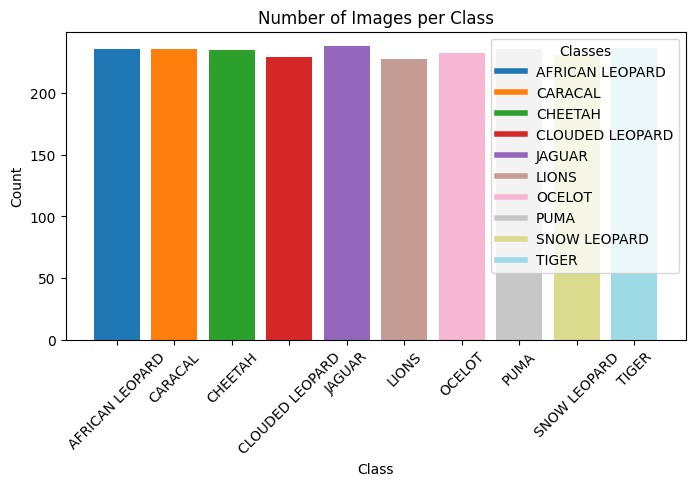

In [7]:
# Get the class labels
class_labels = list(train_generator.class_indices.keys())

# Calculate the count of images per class
class_counts = {label: 0 for label in class_labels}

for i in range(len(train_generator)):
    batch_data, batch_labels = train_generator[i]
    for j in range(len(batch_data)):
        class_idx = int(batch_labels[j].argmax())
        class_label = class_labels[class_idx]
        class_counts[class_label] += 1

# Define unique colors for each class
class_colors = plt.cm.tab20(np.linspace(0, 1, len(class_labels)))

# Create a bar chart with different colors for each class
plt.figure(figsize=(8, 4))
bars = plt.bar(class_counts.keys(), class_counts.values(), color=class_colors)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Number of Images per Class')
plt.xticks(rotation=45)

# Add a legend for class colors
legend_labels = [plt.Line2D([0], [0], color=class_colors[i], lw=4, label=class_labels[i]) for i in range(len(class_labels))]
plt.legend(handles=legend_labels, title="Classes")

plt.show()

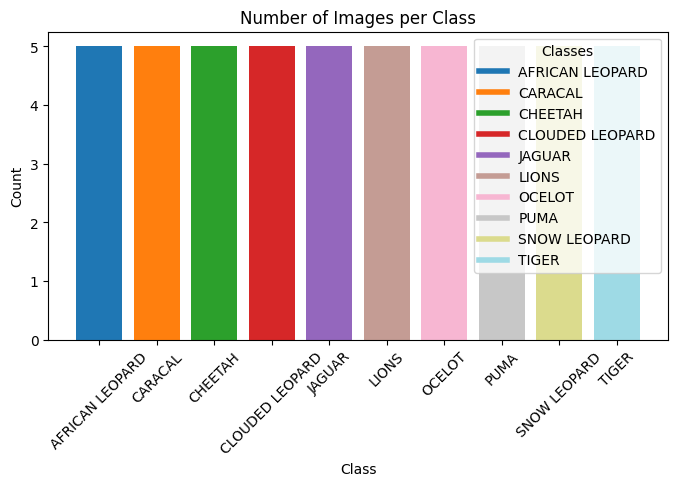

In [8]:
# Get the class labels
class_labels = list(test_generator.class_indices.keys())

# Calculate the count of images per class
class_counts = {label: 0 for label in class_labels}

for i in range(len(test_generator)):
    batch_data, batch_labels = test_generator[i]
    for j in range(len(batch_data)):
        class_idx = int(batch_labels[j].argmax())
        class_label = class_labels[class_idx]
        class_counts[class_label] += 1

# Define unique colors for each class
class_colors = plt.cm.tab20(np.linspace(0, 1, len(class_labels)))

# Create a bar chart with different colors for each class
plt.figure(figsize=(8, 4))
bars = plt.bar(class_counts.keys(), class_counts.values(), color=class_colors)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Number of Images per Class')
plt.xticks(rotation=45)

# Add a legend for class colors
legend_labels = [plt.Line2D([0], [0], color=class_colors[i], lw=4, label=class_labels[i]) for i in range(len(class_labels))]
plt.legend(handles=legend_labels, title="Classes")

plt.show()

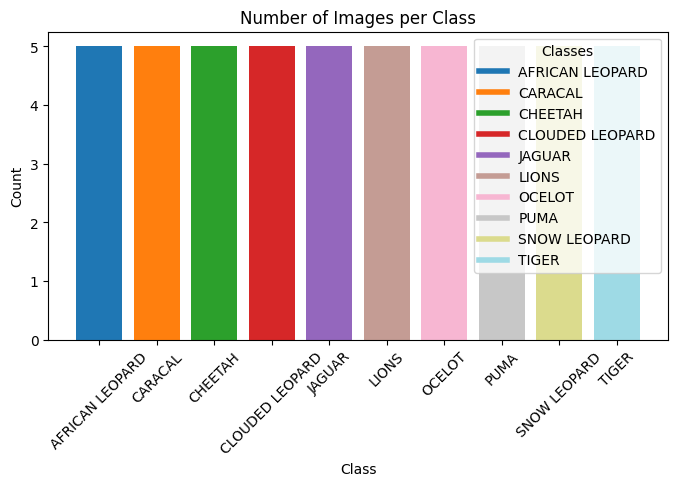

In [9]:
# Get the class labels
class_labels = list(valid_generator.class_indices.keys())

# Calculate the count of images per class
class_counts = {label: 0 for label in class_labels}

for i in range(len(valid_generator)):
    batch_data, batch_labels = valid_generator[i]
    for j in range(len(batch_data)):
        class_idx = int(batch_labels[j].argmax())
        class_label = class_labels[class_idx]
        class_counts[class_label] += 1

# Define unique colors for each class
class_colors = plt.cm.tab20(np.linspace(0, 1, len(class_labels)))

# Create a bar chart with different colors for each class
plt.figure(figsize=(8, 4))
bars = plt.bar(class_counts.keys(), class_counts.values(), color=class_colors)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Number of Images per Class')
plt.xticks(rotation=45)

# Add a legend for class colors
legend_labels = [plt.Line2D([0], [0], color=class_colors[i], lw=4, label=class_labels[i]) for i in range(len(class_labels))]
plt.legend(handles=legend_labels, title="Classes")

plt.show()

#Visualizing images


In [10]:
def Show_Images(target_gen):
    # Get a batch of images and labels
    batch_images, batch_labels = next(target_gen)

    # Get class labels
    class_labels = list(target_gen.class_indices.keys())

    # Display images with labels
    plt.figure(figsize=(20, 20))
    for n , i in enumerate(list(np.random.randint(0,len(batch_images),36))):
        plt.subplot(6, 6, n + 1)
        plt.imshow(batch_images[i])
        plt.title(class_labels[np.argmax(batch_labels[i])])  # Display the class label
        plt.axis('off')
    plt.show()

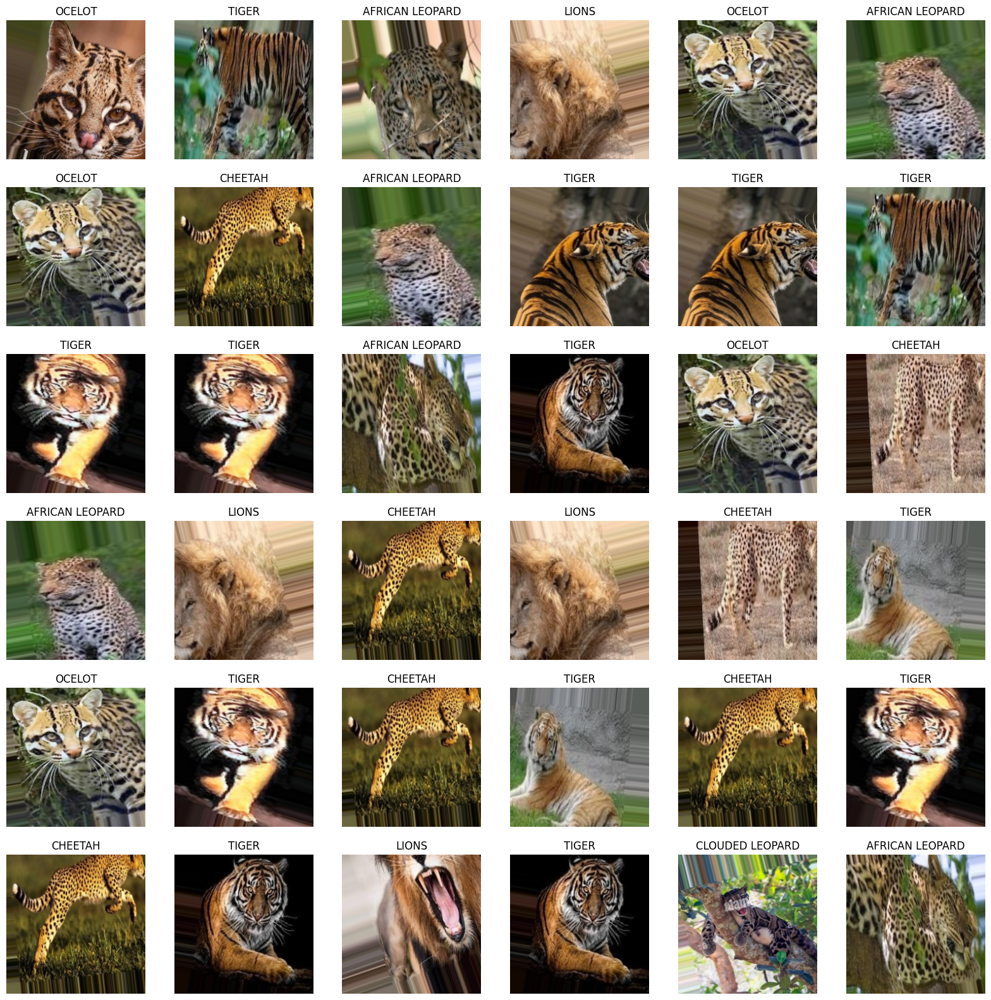

In [11]:
Show_Images(train_generator)

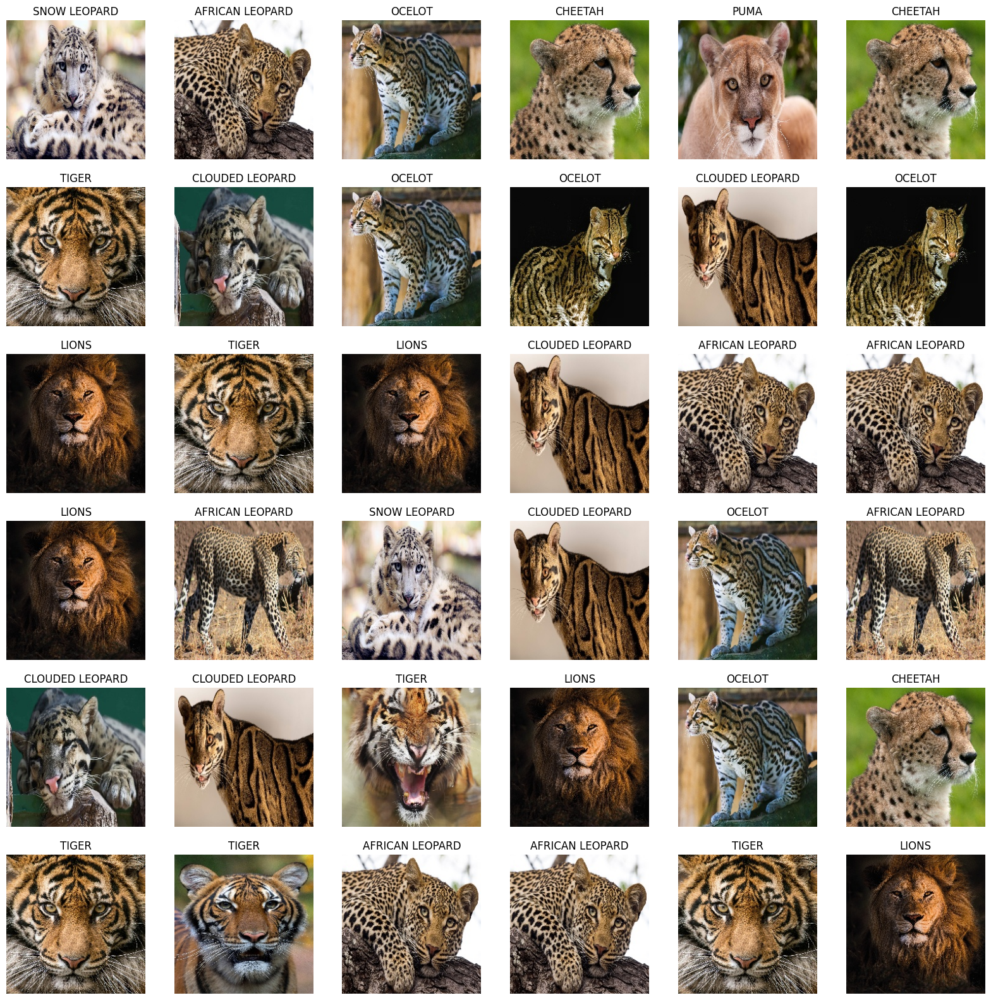

In [12]:
Show_Images(test_generator)

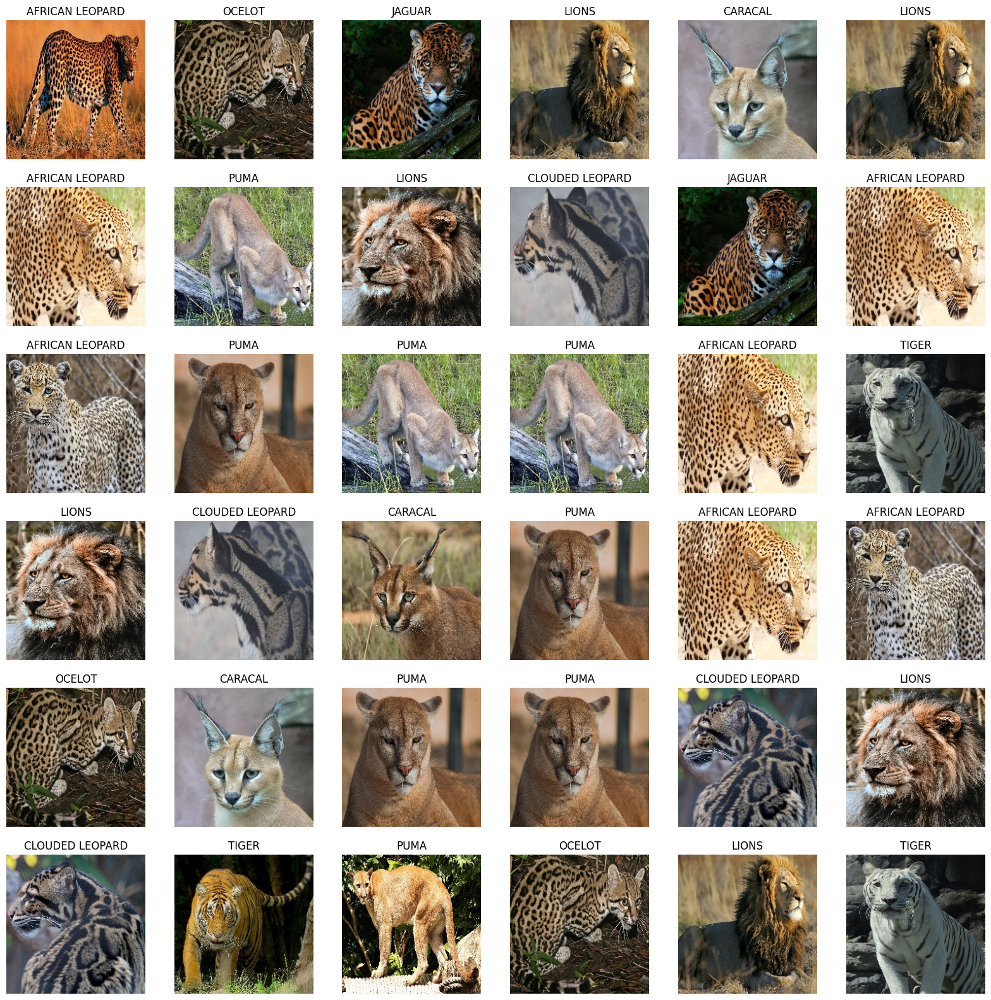

In [13]:
Show_Images(valid_generator)

#EarlyStopping

In [14]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=5, # how many epochs to wait before stopping
    restore_best_weights=True,
)

# Reduction of learning_rate


In [15]:
# Configure the learning rate reduction callback
learning_rate_reduce = ReduceLROnPlateau(
    monitor='val_acc',   # Metric to monitor for changes (usually validation accuracy)
    patience=5,          # Number of epochs with no improvement after which learning rate will be reduced
    verbose=1,           # Verbosity mode (0: silent, 1: update messages)
    factor=0.5,          # Factor by which the learning rate will be reduced (e.g., 0.5 means halving)
    min_lr=0.00001       # Lower bound for the learning rate (it won't go below this value)
)


#Exponential Decay

In [16]:
from tensorflow.keras import optimizers

# Create a learning rate schedule using Exponential Decay
learning_rate_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,  # Initial learning rate for training
    decay_steps=1000,            # Number of steps before decaying the learning rate
    decay_rate=0.5,              # Rate at which the learning rate decreases
)

# learning_rate = initial_learning_rate * decay_rate ^ (global_step / decay_steps)


#Callbacks

In [17]:
from keras.callbacks import LearningRateScheduler

# Create a Learning Rate Scheduler callback using a pre-defined schedule
lr_callback = LearningRateScheduler(learning_rate_schedule)
callback=[ lr_callback , learning_rate_reduce ,early_stopping ]

# Compare between TL Models

In [18]:
# Collect all TL models
TL_Models =[
    ResNet50V2(input_shape=(images_size, images_size, 3), weights='imagenet', include_top=False),
    ResNet152V2(input_shape=(images_size, images_size, 3), weights='imagenet', include_top=False),
    InceptionV3(input_shape=(images_size, images_size, 3), weights='imagenet', include_top=False),
    Xception(input_shape=(images_size, images_size, 3), weights='imagenet', include_top=False),
    MobileNetV2(input_shape=(images_size, images_size, 3), weights='imagenet', include_top=False),
]

# Define all the TL models names. This will be later used during visualization
TL_Models_NAMES = [
    'ResNet50V2',
    'ResNet152V2',
    'InceptionV3',
    'Xception',
    'MobileNetV2',
]

# Freeze the weights of all the TL models
for tl_model in TL_Models:
    tl_model.trainable = False

9406464/9406464 [==============================] - 0s 0us/step


### Subset from training data

In [19]:
# Create variables to collect images and labels
subset_images = []
subset_labels = []

# Set the desired number of images you want in the subset
desired_count = 1000

# Loop through the generator until you have collected the desired number of images
for i in range(desired_count):
    # Generate a batch of data (images and labels)
    batch = train_generator.next()
    images, labels = batch
    subset_images.extend(images)
    subset_labels.extend(labels)

    # Check if you've collected enough images
    if len(subset_images) >= desired_count:
        break

# Convert the collected images and labels to numpy arrays
X_sub = np.array(subset_images)
y_sub = np.array(subset_labels)

### Training the Models and get Histories

In [20]:
# Initialize an empty list to hold the histories of each TL_models architecture.
HISTORIES = []

# Loop over every backbone in the BACKBONES list.
for tl_model in tqdm(TL_Models, desc="Training Tl Models"):

    # Create the simplest model architecture using the current backbone.
    model = keras.Sequential([
        tl_model,
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(10, activation='softmax')
    ])

    # Compile the model with the specified loss function, optimizer, and metrics.
    model.compile(
        loss='categorical_crossentropy',
        optimizer=Adam(learning_rate = learning_rate_schedule),
        metrics='accuracy'
    )

    # Train the model on a subset of the training data.
    history = model.fit(
        X_sub, y_sub,
        epochs=20,
        validation_split=0.2,
        batch_size=batch_size
    )

    # Store the history of the trained model.
    HISTORIES.append(history.history)

Training Tl Models:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/20
51/51 [==============================] - 20s 150ms/step - loss: 1.5357 - accuracy: 0.6650 - val_loss: 0.6177 - val_accuracy: 0.8416
Epoch 2/20
51/51 [==============================] - 3s 64ms/step - loss: 0.4706 - accuracy: 0.8722 - val_loss: 0.4871 - val_accuracy: 0.8762
Epoch 3/20
51/51 [==============================] - 3s 63ms/step - loss: 0.3871 - accuracy: 0.8958 - val_loss: 0.5609 - val_accuracy: 0.8663
Epoch 4/20
51/51 [==============================] - 3s 67ms/step - loss: 0.3321 - accuracy: 0.9256 - val_loss: 0.7710 - val_accuracy: 0.8317
Epoch 5/20
51/51 [==============================] - 3s 65ms/step - loss: 0.2843 - accuracy: 0.9280 - val_loss: 0.5359 - val_accuracy: 0.9010
Epoch 6/20
51/51 [==============================] - 3s 63ms/step - loss: 0.3039 - accuracy: 0.9156 - val_loss: 0.6532 - val_accuracy: 0.8713
Epoch 7/20
51/51 [==============================] - 3s 63ms/step - loss: 0.1994 - accuracy: 0.9491 - val_loss: 0.6074 - val_accuracy: 0.9059
Epoch 8/20


Training Tl Models:  20%|██        | 1/5 [01:28<05:54, 88.61s/it]

Epoch 1/20
51/51 [==============================] - 29s 247ms/step - loss: 1.3754 - accuracy: 0.7395 - val_loss: 0.9409 - val_accuracy: 0.8168
Epoch 2/20
51/51 [==============================] - 8s 161ms/step - loss: 0.7119 - accuracy: 0.8648 - val_loss: 0.4913 - val_accuracy: 0.9109
Epoch 3/20
51/51 [==============================] - 9s 187ms/step - loss: 0.3518 - accuracy: 0.9169 - val_loss: 0.5001 - val_accuracy: 0.9158
Epoch 4/20
51/51 [==============================] - 9s 184ms/step - loss: 0.4030 - accuracy: 0.9107 - val_loss: 0.4602 - val_accuracy: 0.9109
Epoch 5/20
51/51 [==============================] - 8s 165ms/step - loss: 0.3367 - accuracy: 0.9280 - val_loss: 0.3866 - val_accuracy: 0.9356
Epoch 6/20
51/51 [==============================] - 8s 166ms/step - loss: 0.3154 - accuracy: 0.9243 - val_loss: 0.6223 - val_accuracy: 0.8564
Epoch 7/20
51/51 [==============================] - 9s 181ms/step - loss: 0.1983 - accuracy: 0.9392 - val_loss: 0.5356 - val_accuracy: 0.9059
Epoch

Training Tl Models:  40%|████      | 2/5 [05:09<08:19, 166.59s/it]

Epoch 1/20
51/51 [==============================] - 13s 124ms/step - loss: 1.7751 - accuracy: 0.6911 - val_loss: 0.8131 - val_accuracy: 0.8416
Epoch 2/20
51/51 [==============================] - 3s 55ms/step - loss: 0.5711 - accuracy: 0.8859 - val_loss: 0.9256 - val_accuracy: 0.8515
Epoch 3/20
51/51 [==============================] - 3s 58ms/step - loss: 0.5807 - accuracy: 0.8809 - val_loss: 0.7227 - val_accuracy: 0.8762
Epoch 4/20
51/51 [==============================] - 3s 55ms/step - loss: 0.4696 - accuracy: 0.9082 - val_loss: 0.6729 - val_accuracy: 0.9059
Epoch 5/20
51/51 [==============================] - 3s 55ms/step - loss: 0.3372 - accuracy: 0.9392 - val_loss: 0.7567 - val_accuracy: 0.8960
Epoch 6/20
51/51 [==============================] - 3s 56ms/step - loss: 0.2979 - accuracy: 0.9280 - val_loss: 0.7689 - val_accuracy: 0.8762
Epoch 7/20
51/51 [==============================] - 3s 55ms/step - loss: 0.2986 - accuracy: 0.9417 - val_loss: 0.9603 - val_accuracy: 0.8713
Epoch 8/20


Training Tl Models:  60%|██████    | 3/5 [06:38<04:21, 130.95s/it]

Epoch 1/20
51/51 [==============================] - 11s 151ms/step - loss: 0.8729 - accuracy: 0.7568 - val_loss: 0.3802 - val_accuracy: 0.9059
Epoch 2/20
51/51 [==============================] - 5s 92ms/step - loss: 0.2626 - accuracy: 0.9206 - val_loss: 0.4176 - val_accuracy: 0.8762
Epoch 3/20
51/51 [==============================] - 4s 84ms/step - loss: 0.2110 - accuracy: 0.9318 - val_loss: 0.3320 - val_accuracy: 0.8960
Epoch 4/20
51/51 [==============================] - 5s 94ms/step - loss: 0.2174 - accuracy: 0.9318 - val_loss: 0.4803 - val_accuracy: 0.8812
Epoch 5/20
51/51 [==============================] - 5s 95ms/step - loss: 0.1649 - accuracy: 0.9479 - val_loss: 0.3002 - val_accuracy: 0.9109
Epoch 6/20
51/51 [==============================] - 4s 86ms/step - loss: 0.2488 - accuracy: 0.9256 - val_loss: 0.4346 - val_accuracy: 0.8812
Epoch 7/20
51/51 [==============================] - 5s 96ms/step - loss: 0.1703 - accuracy: 0.9491 - val_loss: 0.3717 - val_accuracy: 0.8960
Epoch 8/20


Training Tl Models:  80%|████████  | 4/5 [08:18<01:58, 118.74s/it]

Epoch 1/20
51/51 [==============================] - 8s 102ms/step - loss: 1.3878 - accuracy: 0.6439 - val_loss: 0.6330 - val_accuracy: 0.8515
Epoch 2/20
51/51 [==============================] - 2s 36ms/step - loss: 0.4980 - accuracy: 0.8573 - val_loss: 0.5824 - val_accuracy: 0.8416
Epoch 3/20
51/51 [==============================] - 2s 34ms/step - loss: 0.5479 - accuracy: 0.8586 - val_loss: 0.7168 - val_accuracy: 0.8465
Epoch 4/20
51/51 [==============================] - 2s 33ms/step - loss: 0.4552 - accuracy: 0.8685 - val_loss: 0.6893 - val_accuracy: 0.8465
Epoch 5/20
51/51 [==============================] - 2s 33ms/step - loss: 0.3689 - accuracy: 0.9032 - val_loss: 0.7875 - val_accuracy: 0.8416
Epoch 6/20
51/51 [==============================] - 2s 33ms/step - loss: 0.2162 - accuracy: 0.9318 - val_loss: 0.5538 - val_accuracy: 0.8812
Epoch 7/20
51/51 [==============================] - 2s 33ms/step - loss: 0.2207 - accuracy: 0.9293 - val_loss: 0.7583 - val_accuracy: 0.8564
Epoch 8/20
5

Training Tl Models: 100%|██████████| 5/5 [09:03<00:00, 108.68s/it]


### Analyze the performance of TL Models

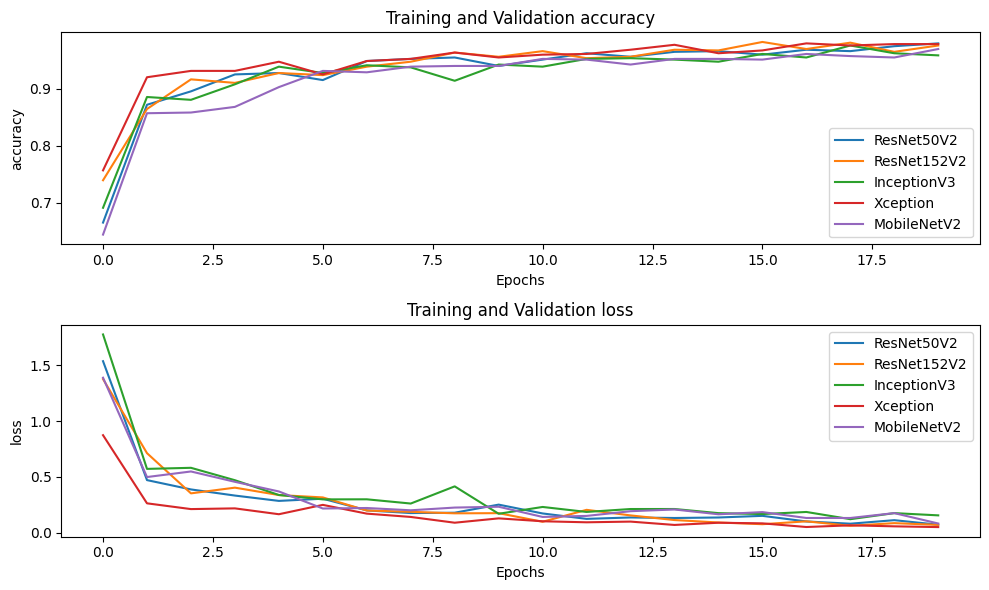

In [21]:
import matplotlib.pyplot as plt

# Define the metrics to plot (e.g., 'accuracy' and 'loss')
metrics_to_plot = ['accuracy', 'loss']

# Create subplots for each metric
fig, axes = plt.subplots(len(metrics_to_plot), 1, figsize=(10, 6))

for i, metric in enumerate(metrics_to_plot):
    plt.subplot(2, 1, i+1)  # Create subplots for each metric
    for idx, history in enumerate(HISTORIES):
        plt.plot(history[metric], label=TL_Models_NAMES[idx])
    plt.title(f'Training and Validation {metric}')
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend()

plt.tight_layout()
plt.show()


#Get the weights

In [22]:
base_model = ResNet50V2(weights='imagenet', include_top=False, input_shape=(images_size, images_size, 3))

#Freeze the layers

In [23]:
# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False


#Build the model

In [24]:
model = tf.keras.models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),

    layers.Flatten(),

    layers.Dense(256,activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(10,activation='softmax'),
])

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d_5  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense_5 (Dense)             (None, 256)               524544    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_6 (Dense)             (None, 10)                2570      
                                                      

# Set the optimizer

In [25]:
from tensorflow.keras import optimizers

optimizer = optimizers.Adam(learning_rate=learning_rate_schedule)

In [26]:
model.compile(optimizer=optimizer,
             loss="categorical_crossentropy",
              metrics=['accuracy']
             )

# Training the model

In [27]:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=20,
    validation_data=valid_generator,
    batch_size=batch_size,
    validation_steps=valid_generator.samples // batch_size,
    callbacks=[callback]
)

Epoch 1/20
146/146 [==============================] - ETA: 0s - loss: 1.5663 - accuracy: 0.7008

146/146 [==============================] - 45s 274ms/step - loss: 1.5663 - accuracy: 0.7008 - val_loss: 0.2200 - val_accuracy: 0.8958 - lr: 0.0090
Epoch 2/20
146/146 [==============================] - ETA: 0s - loss: 0.6132 - accuracy: 0.8024

146/146 [==============================] - 38s 260ms/step - loss: 0.6132 - accuracy: 0.8024 - val_loss: 0.2232 - val_accuracy: 0.9167 - lr: 0.0082
Epoch 3/20
146/146 [==============================] - ETA: 0s - loss: 0.6211 - accuracy: 0.8106

146/146 [==============================] - 40s 274ms/step - loss: 0.6211 - accuracy: 0.8106 - val_loss: 0.1948 - val_accuracy: 0.9375 - lr: 0.0074
Epoch 4/20
146/146 [==============================] - ETA: 0s - loss: 0.5887 - accuracy: 0.8089

146/146 [==============================] - 36s 249ms/step - loss: 0.5887 - accuracy: 0.8089 - val_loss: 0.4271 - val_accuracy: 0.8958 - lr: 0.0067
Epoch 5/20
146/146 [==============================] - ETA: 0s - loss: 0.5918 - accuracy: 0.8132

146/146 [==============================] - 48s 332ms/step - loss: 0.5918 - accuracy: 0.8132 - val_loss: 0.2484 - val_accuracy: 0.9375 - lr: 0.0060
Epoch 6/20
146/146 [==============================] - ETA: 0s - loss: 0.5308 - accuracy: 0.8403

146/146 [==============================] - 36s 249ms/step - loss: 0.5308 - accuracy: 0.8403 - val_loss: 0.1578 - val_accuracy: 0.9583 - lr: 0.0055
Epoch 7/20
146/146 [==============================] - ETA: 0s - loss: 0.5179 - accuracy: 0.8394

146/146 [==============================] - 39s 268ms/step - loss: 0.5179 - accuracy: 0.8394 - val_loss: 0.2818 - val_accuracy: 0.9375 - lr: 0.0049
Epoch 8/20
146/146 [==============================] - ETA: 0s - loss: 0.4557 - accuracy: 0.8631

146/146 [==============================] - 38s 262ms/step - loss: 0.4557 - accuracy: 0.8631 - val_loss: 0.2620 - val_accuracy: 0.9375 - lr: 0.0045
Epoch 9/20
146/146 [==============================] - ETA: 0s - loss: 0.4307 - accuracy: 0.8696

146/146 [==============================] - 36s 248ms/step - loss: 0.4307 - accuracy: 0.8696 - val_loss: 0.2143 - val_accuracy: 0.9375 - lr: 0.0040
Epoch 10/20
146/146 [==============================] - ETA: 0s - loss: 0.3745 - accuracy: 0.8915

146/146 [==============================] - 39s 270ms/step - loss: 0.3745 - accuracy: 0.8915 - val_loss: 0.1624 - val_accuracy: 0.8750 - lr: 0.0036
Epoch 11/20
146/146 [==============================] - ETA: 0s - loss: 0.3697 - accuracy: 0.8820

146/146 [==============================] - 38s 257ms/step - loss: 0.3697 - accuracy: 0.8820 - val_loss: 0.1330 - val_accuracy: 0.9583 - lr: 0.0033
Epoch 12/20
146/146 [==============================] - ETA: 0s - loss: 0.3432 - accuracy: 0.8937

146/146 [==============================] - 37s 251ms/step - loss: 0.3432 - accuracy: 0.8937 - val_loss: 0.0833 - val_accuracy: 0.9583 - lr: 0.0030
Epoch 13/20
146/146 [==============================] - ETA: 0s - loss: 0.2939 - accuracy: 0.9062

146/146 [==============================] - 38s 258ms/step - loss: 0.2939 - accuracy: 0.9062 - val_loss: 0.1557 - val_accuracy: 0.9583 - lr: 0.0027
Epoch 14/20
146/146 [==============================] - ETA: 0s - loss: 0.3136 - accuracy: 0.9036

146/146 [==============================] - 37s 255ms/step - loss: 0.3136 - accuracy: 0.9036 - val_loss: 0.1408 - val_accuracy: 0.9583 - lr: 0.0024
Epoch 15/20
146/146 [==============================] - ETA: 0s - loss: 0.2997 - accuracy: 0.9010

146/146 [==============================] - 38s 260ms/step - loss: 0.2997 - accuracy: 0.9010 - val_loss: 0.1054 - val_accuracy: 0.9792 - lr: 0.0022
Epoch 16/20
146/146 [==============================] - ETA: 0s - loss: 0.2665 - accuracy: 0.9096

146/146 [==============================] - 38s 256ms/step - loss: 0.2665 - accuracy: 0.9096 - val_loss: 0.2001 - val_accuracy: 0.9792 - lr: 0.0020
Epoch 17/20
146/146 [==============================] - ETA: 0s - loss: 0.2753 - accuracy: 0.9100

146/146 [==============================] - 38s 261ms/step - loss: 0.2753 - accuracy: 0.9100 - val_loss: 0.1466 - val_accuracy: 0.9583 - lr: 0.0018


#Evaluate the model

In [28]:
# Evaluate on test dataset
score = model.evaluate(test_generator, verbose=False)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.02155800350010395
Test accuracy: 1.0


1/1 [==============================] - 0s 24ms/step


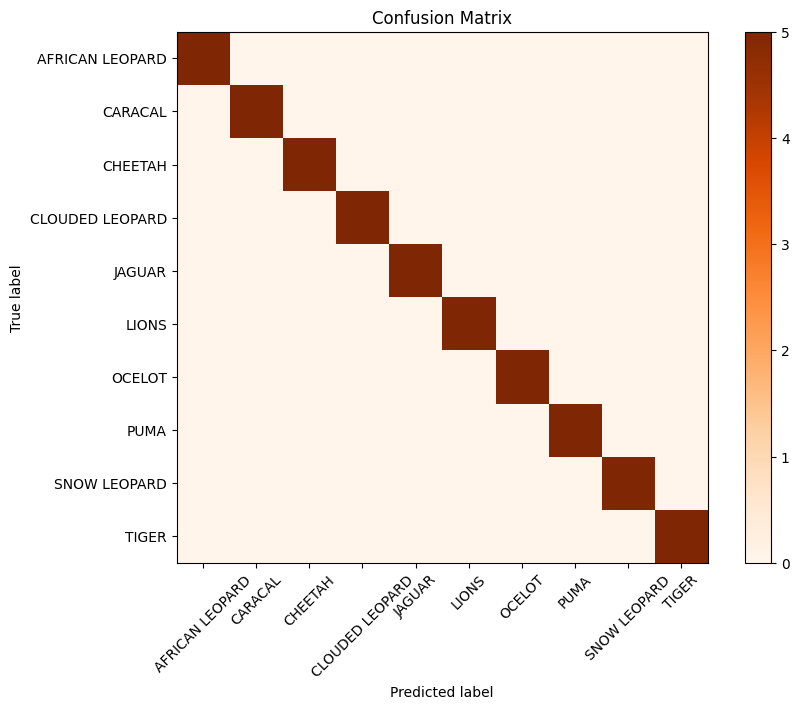

In [29]:
true_labels = []
predicted_labels = []

num_batches = len(test_generator)
for i in range(num_batches):
    x_batch, y_batch = test_generator[i]
    predictions = model.predict(x_batch)
    true_labels.extend(np.argmax(y_batch, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))


class_names = test_generator.class_indices.keys()
# Calculate the confusion matrix
confusion = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(9, 7))
# Create a visualization of the confusion matrix
classes = [str(i) for i in range(len(test_generator.class_indices))]
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('Oranges'))
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


In [30]:
# Calculate the classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices)

# Print the classification report
print(report)

                 precision    recall  f1-score   support

AFRICAN LEOPARD       1.00      1.00      1.00         5
        CARACAL       1.00      1.00      1.00         5
        CHEETAH       1.00      1.00      1.00         5
CLOUDED LEOPARD       1.00      1.00      1.00         5
         JAGUAR       1.00      1.00      1.00         5
          LIONS       1.00      1.00      1.00         5
         OCELOT       1.00      1.00      1.00         5
           PUMA       1.00      1.00      1.00         5
   SNOW LEOPARD       1.00      1.00      1.00         5
          TIGER       1.00      1.00      1.00         5

       accuracy                           1.00        50
      macro avg       1.00      1.00      1.00        50
   weighted avg       1.00      1.00      1.00        50



# Generate predictions for the test data

1/1 [==============================] - 0s 29ms/step


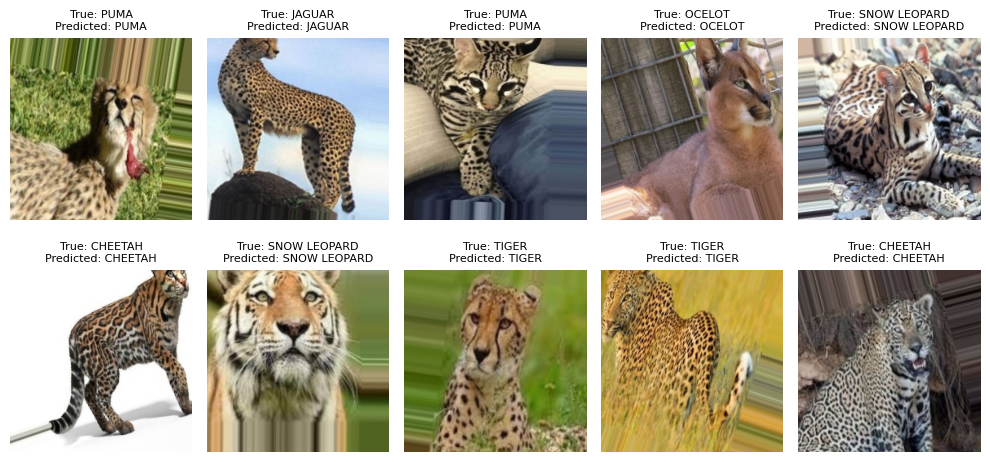

In [31]:
# Collect true labels and model predictions
true_labels = []
predicted_labels = []
class_names = test_generator.class_indices.keys()
class_names = list(class_names)
num_batches = len(train_generator)
for i in range(10):
    x_batch, y_batch = train_generator[i]
    predictions = model.predict(x_batch)
    true_labels.extend(np.argmax(y_batch, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))


true_class_labels = [class_names[i] for i in true_labels]
predicted_class_labels = [class_names[i] for i in predicted_labels]

# Plot true labels and predicted labels
plt.figure(figsize=(10, 5))
num_samples_to_display = min(10, len(x_batch))  # Display up to 10 samples or less if available
for i in range(num_samples_to_display):
    plt.subplot(2, 5, i + 1)
    plt.imshow(x_batch[i])
    plt.title(f'True: {true_class_labels[i]}\nPredicted: {predicted_class_labels[i]}', fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

#Saving the model

In [32]:
import pickle
pickle.dump(model, open('model.pkl', 'wb'))

In [33]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
